<a href="https://colab.research.google.com/github/ZahraBehzad/learn-CNN/blob/main/SRCNN_PyTorch_SaltAndPepper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
cd drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/

/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper


اضافه کردن نویز فلفل نمک به تصاویر ترین

In [ ]:
import cv2
import numpy as np
import os
import random

def add_salt_pepper_noise(image, amount=0.005, salt_vs_pepper=0.5):
    noisy = image.copy()
    total_pixels = image.shape[0] * image.shape[1]

    num_salt = int(amount * total_pixels * salt_vs_pepper)
    num_pepper = int(amount * total_pixels * (1.0 - salt_vs_pepper))

    # Salt noise (white pixels)
    for _ in range(num_salt):
        i = random.randint(0, image.shape[0] - 1)
        j = random.randint(0, image.shape[1] - 1)
        noisy[i, j] = [255, 255, 255]  # RGB white

    # Pepper noise (black pixels)
    for _ in range(num_pepper):
        i = random.randint(0, image.shape[0] - 1)
        j = random.randint(0, image.shape[1] - 1)
        noisy[i, j] = [0, 0, 0]  # RGB black

    return noisy

def add_noise_to_folder(folder_path, amount=0.005):
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            img_path = os.path.join(folder_path, filename)
            image = cv2.imread(img_path)
            if image is None:
                continue
            noisy_image = add_salt_pepper_noise(image, amount=amount)
            cv2.imwrite(img_path, noisy_image)



folder_path = 'data/T91/SRCNN/train'
add_noise_to_folder(folder_path, amount=0.01)
print("salt and pepper noise added to images successfully!")


salt and pepper noise added to images successfully!


In [ ]:
!python train.py

2025-05-21 07:46:25.093868: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747813585.113232    7267 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747813585.119241    7267 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-21 07:46:25.139048: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker

In [ ]:
!python test.py

Build SRCNN model successfully.
Load SRCNN model weights `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/results/SRCNN_x2/last.pth.tar` successfully.
Processing `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/data/Set5/GTmod12/baby.png`...
[ WARN:0@5.915] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.
Processing `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/data/Set5/GTmod12/bird.png`...
Processing `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/data/Set5/GTmod12/butterfly.png`...
Processing `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/data/Set5/GTmod12/head.png`...
Processing `/content/drive/MyDrive/SRCNN-PyTorch-SaltAndPepper/data/Set5/GTmod12/woman.png`...
PSNR: 30.37 dB
SSIM: 0.8751 u
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0114503475..1.004201].
Clipping input data to the valid range for imshow with RGB data ([0..1] for

Displaying: /content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2/baby.png_comparison.png


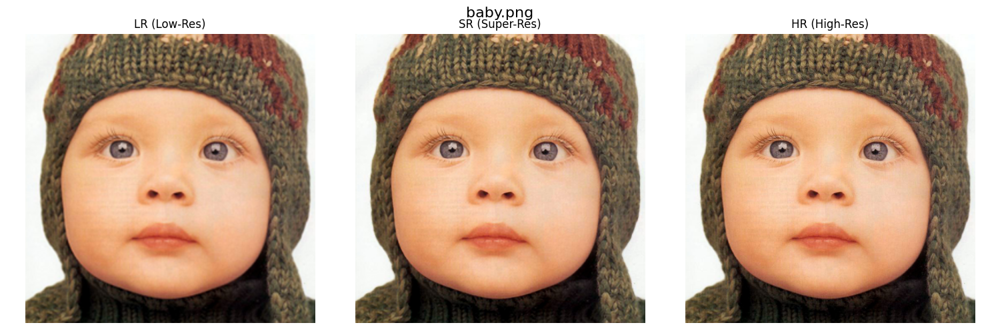

Displaying: /content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2/bird.png_comparison.png


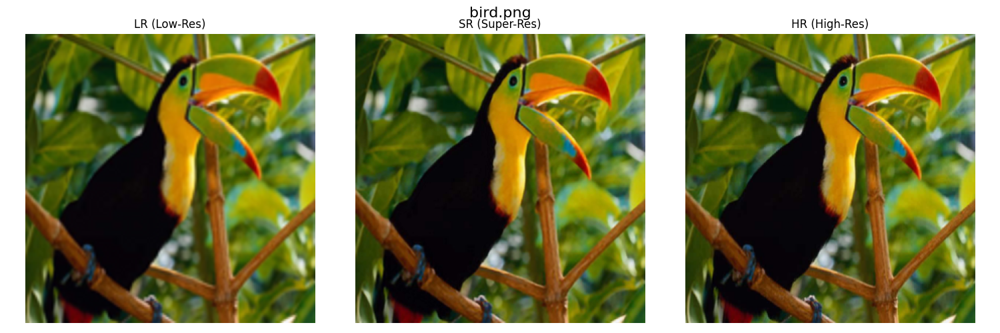

Displaying: /content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2/butterfly.png_comparison.png


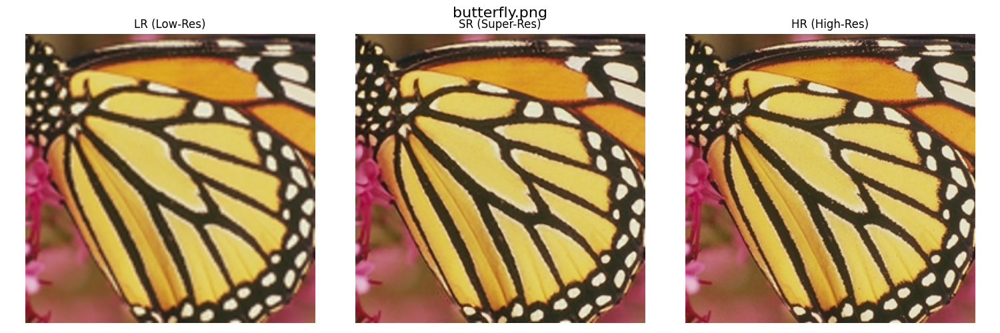

Displaying: /content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2/head.png_comparison.png


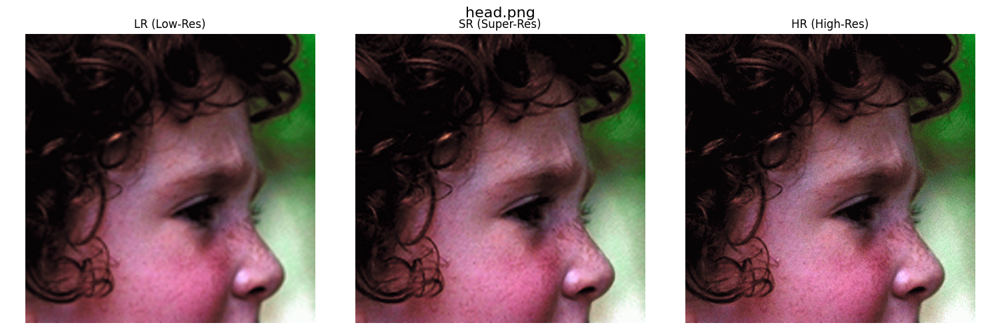

Displaying: /content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2/woman.png_comparison.png


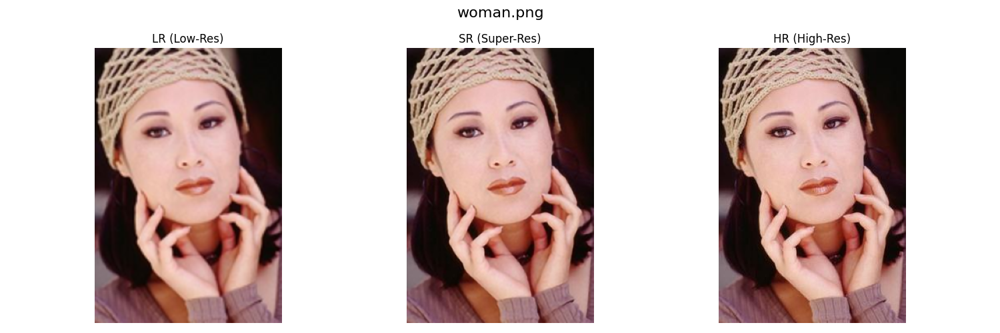

In [ ]:
from IPython.display import Image, display
import os

# مسیر نتایج تست (نام پوشه‌ی exp را درست وارد کن)
results_dir = "/content/drive/MyDrive/SRCNN-PyTorch-main/results/test/SRCNN_x2"

# بررسی وجود مسیر
if not os.path.exists(results_dir):
    print(f"Directory not found: {results_dir}")
else:
    # نمایش تمام فایل‌های تصویری که به _comparison.png ختم می‌شوند
    image_files = sorted([f for f in os.listdir(results_dir) if f.endswith("_comparison.png")])

    if not image_files:
        print("No _comparison.png files found.")
    else:
        for image_name in image_files:
            image_path = os.path.join(results_dir, image_name)
            print(f"Displaying: {image_path}")
            display(Image(filename=image_path))


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=samples/logs/SRCNN_x2 --port=6008


<IPython.core.display.Javascript object>